## <font color='darkblue'>Wake Word Detection</font>

In this notebook, we will construct a speech dataset, implement an algorithm for wake word detection (sometimes also called keyword detection, or trigger word detection) and provide a base for real time demo. 

* Wake word detection is the technology that allows devices like Amazon Alexa, Google Home and Apple Siri to wake up upon hearing a certain word.  
* For this project, our trigger word will be "Activate". We can also use any other word (with atleast 3 syllables) like computer, assistant etc., by following the same process. Every time it hears you say "activate," it will make a "chiming" sound.
* By the end of this project, we will be able to record a clip of ourself talking, and have the algorithm trigger a function when it detects us saying "activate." 
* In continuation of this project, perhaps we can also extend it to run on your laptop so that every time you say "activate" it starts up your favorite app, or turns on a network connected lamp in your house, or triggers some other event? 

<img src="images/sound.png" style="width:1000px;height:150px;">

In this project we will: 
- Structure a speech recognition project
- Synthesize and process audio recordings to create train/dev datasets
- Train a trigger word detection model and make predictions
- Use the model for real time demonstration

In [1]:
import random
import sys
import io
import os
import glob
import IPython
import wave
import numpy as np

import matplotlib.pyplot as plt
import matplotlib.mlab as mlab
%matplotlib inline
from scipy.io import wavfile

from pydub import AudioSegment

C:\ProgramData\Anaconda3\lib\site-packages\pydub\utils.py:170: RuntimeWarning: Couldn't find ffmpeg or avconv - defaulting to ffmpeg, but may not work
  warn("Couldn't find ffmpeg or avconv - defaulting to ffmpeg, but may not work", RuntimeWarning)


Below we have defined some helper functions that will be used in loading and creating speech dataset.

In [2]:
# Calculate and plot spectrogram for a wav audio file
def graph_spectrogram(wav_file):
    rate, data = get_wav_info(wav_file)
    nfft = 200 # Length of each window segment
    fs = 8000 # Sampling frequencies
    noverlap = 120 # Overlap between windows
    nchannels = data.ndim
    if nchannels == 1:
        pxx, freqs, bins, im = plt.specgram(data, nfft, fs, noverlap = noverlap)
    elif nchannels == 2:
        pxx, freqs, bins, im = plt.specgram(data[:,0], nfft, fs, noverlap = noverlap)
    return pxx

# Load a wav file
def get_wav_info(wav_file):
    rate, data = wavfile.read(wav_file)
    return rate, data

# Used to standardize volume of audio clip
def match_target_amplitude(sound, target_dBFS):
    change_in_dBFS = target_dBFS - sound.dBFS
    return sound.apply_gain(change_in_dBFS)

# Load raw audio files for speech synthesis
def load_raw_audio():
    positives = []
    backgrounds = []
    negatives = []
    for filename in os.listdir("./raw_data/positive"):
        if filename.endswith("wav"):
            positive = AudioSegment.from_wav("./raw_data/positive/"+filename)
            positives.append(positive)
    for filename in os.listdir("./raw_data/backgrounds"):
        if filename.endswith("wav"):
            background = AudioSegment.from_wav("./raw_data/backgrounds/"+filename)
            backgrounds.append(background)
    for filename in os.listdir("./raw_data/negative"):
        if filename.endswith("wav"):
            negative = AudioSegment.from_wav("./raw_data/negative/"+filename)
            negatives.append(negative)
    return positives, negatives, backgrounds

# 1 - Data synthesis: Creating a speech dataset 

Let's start by building a dataset for our trigger word detection algorithm. 
* A speech dataset should ideally be as close as possible to the application you will want to run it on. 
* In this case, we'd like to detect the word "activate" in working environments (library, home, offices, open-spaces ...). 
* Therefore, we need to create recordings with a mix of positive words ("activate") and negative words (random words other than activate) on different background sounds. Let's see how we can create such a dataset. 

## 1.1 - Listening to the data   

* To have the data as close as possibile to real world, we've gone to libraries, cafes, restaurants, homes and offices all around the region to record background noises, as well as snippets of audio of people saying positive/negative words. This dataset includes people speaking in a variety of accents.
* Video from online sources like YouTube can also be used for training but evaluation must be done on data which model will see upon deployment.
* We have a subset of the raw audio files of the positive words, negative words, and background noise. We will use these audio files to synthesize a dataset to train the model. 
    * The "positive" directory contains positive examples of people saying the word "activate". 
    * The "negatives" directory contains negative examples of people saying random words other than "activate". 
    * There is one word per audio recording. 
    * The "backgrounds" directory contains 10 second clips of background noise in different environments.

We can run the cells below to listen to some examples.

In [ ]:
IPython.display.Audio("./raw_data/positive/1.wav")

In [ ]:
IPython.display.Audio("./raw_data/positive/2.wav")

## 1.2 - From audio recordings to spectrograms

What really is an audio recording? 
* A microphone records little variations in air pressure over time, and it is these little variations in air pressure that your ear also perceives as sound. 
* You can think of an audio recording is a long list of numbers measuring the little air pressure changes detected by the microphone. 
* We will use audio sampled at 44100 Hz (or 44100 Hertz). 
    * This means the microphone gives us 44,100 numbers per second. 
    * Thus, a 10 second audio clip is represented by 441,000 numbers (= $10 \times 44,100$). 

#### Spectrogram
* It is quite difficult to figure out from this "raw" representation of audio whether the word "activate" was said. 
* In  order to help your sequence model more easily learn to detect trigger words, we will compute a *spectrogram* of the audio. 
* The spectrogram tells us how much different frequencies are present in an audio clip at any moment in time. 
* If you've ever taken an advanced class on signal processing or on Fourier transforms:
    * A spectrogram is computed by sliding a window over the raw audio signal, and calculating the most active frequencies in each window using a Fourier transform. 
Let's look at an example. 

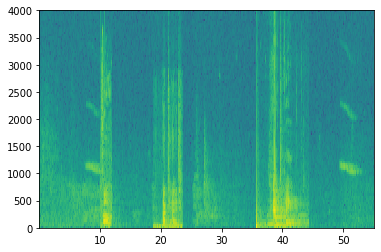

In [ ]:
x = graph_spectrogram("./audio_examples/example_train.wav")

The graph above represents how active each frequency is (y axis) over a number of time-steps (x axis). 

<img src="images/spectrogram.png" style="width:500px;height:200px;">
<center> **Figure 1**: Spectrogram of an audio recording </center>


* The color in the spectrogram shows the degree to which different frequencies are present (loud) in the audio at different points in time. 
* Green means a certain frequency is more active or more present in the audio clip (louder).
* Blue squares denote less active frequencies.
* The dimension of the output spectrogram depends upon the hyperparameters of the spectrogram software and the length of the input. 
* In this notebook, we will be working with 10 second audio clips as the "standard length" for our training examples. 
    * The number of timesteps of the spectrogram will be 5511. 
    * You'll see later that the spectrogram will be the input $x$ into the network, and so $T_x = 5511$.

In [ ]:
_, data = wavfile.read("audio_examples/example_train.wav")
print("Time steps in audio recording before spectrogram", data[:,0].shape)
print("Time steps in input after spectrogram", x.shape)

44100

Now, we can define:

In [3]:
Tx = 5511 # The number of time steps input to the model from the spectrogram
n_freq = 101 # Number of frequencies input to the model at each time step of the spectrogram

#### Dividing into time-intervals
Note that we may divide a 10 second interval of time with different units (steps).
* Raw audio divides 10 seconds into 441,000 units.
* A spectrogram divides 10 seconds into 5,511 units.
    * $T_x = 5511$
* You will use a Python module `pydub` to synthesize audio, and it divides 10 seconds into 10,000 units.
* The output of our model will divide 10 seconds into 1,375 units.
    * $T_y = 1375$
    * For each of the 1375 time steps, the model predicts whether someone recently finished saying the trigger word "activate." 
* All of these are hyperparameters and can be changed (except the 441000, which is a function of the microphone). 
* We have chosen values that are within the standard range used for speech systems.

In [4]:
Ty = 1375 # The number of time steps in the output of our model

## 1.3 - Generating a single training example

#### Benefits of synthesizing data
Because speech data is hard to acquire and label, we will synthesize our training data using the audio clips of activates, negatives, and backgrounds. 
* It is quite slow to record lots of 10 second audio clips with random "activates" in it. 
* Instead, it is easier to record lots of positives and negative words, and record background noise separately (or download background noise from free online sources). 

#### Process for Synthesizing an audio clip
* To synthesize a single training example, we will:
    - Pick a random 10 second background audio clip
    - Randomly insert 0-4 audio clips of "activate" into this 10sec clip
    - Randomly insert 0-2 audio clips of negative words into this 10sec clip
* Because we have synthesized the word "activate" into the background clip, we know exactly when in the 10 second clip the "activate" makes its appearance. 
    * We'll see later that this makes it easier to generate the labels $y^{\langle t \rangle}$ as well. 

#### Pydub
* We will use the pydub package to manipulate audio. 
* Pydub converts raw audio files into lists of Pydub data structures.
* Pydub uses 1ms as the discretization interval (1ms is 1 millisecond = 1/1000 seconds).
    * This is why a 10 second clip is always represented using 10,000 steps. 

In [ ]:
# Load audio segments using pydub 
positives, negatives, backgrounds = load_raw_audio()

print("background len should be 10,000, since it is a 10 sec clip\n" + str(len(backgrounds[0])),"\n")
print("activate[0] len may be around 1000, since an `activate` audio clip is usually around 1 second (but varies a lot) \n" + str(len(positives[0])),"\n")
print("activate[1] len: different `activate` clips can have different lengths\n" + str(len(positives[1])),"\n")

background len should be 10,000, since it is a 10 sec clip
10000 

activate[0] len may be around 1000, since an `activate` audio clip is usually around 1 second (but varies a lot) 
836 

activate[1] len: different `activate` clips can have different lengths
1045 



### Overlaying positive/negative 'word' audio clips on top of the background audio

* Given a 10 second background clip and a short audio clip containing a positive or negative word, we need to be able to "add" the word audio clip on top of the background audio.
* We will be inserting multiple clips of positive/negative words into the background, and we don't want to insert an "activate" or a random word somewhere that overlaps with another clip we had previously added. 
    * To ensure that the 'word' audio segments do not overlap when inserted, we will keep track of the times of previously inserted audio clips. 
* To be clear, when we insert a 1 second "activate" onto a 10 second clip of cafe noise, **we do not end up with an 11 sec clip.** 
    * The resulting audio clip is still 10 seconds long.
    * We'll see that pydub allows us to do this. 

#### Label the positive/negative words
* Recall that the labels $y^{\langle t \rangle}$ represent whether or not someone has just finished saying "activate." 
    * $y^{\langle t \rangle} = 1$ when that that clip has finished saying "activate".
    * Given a background clip, we can initialize $y^{\langle t \rangle}=0$ for all $t$, since the clip doesn't contain any "activates." 
* When we insert or overlay an "activate" clip, we will also update labels for $y^{\langle t \rangle}$.
    * Rather than updating the label of a single time step, we will update 50 steps of the output to have target label 1. 
    * Updating several consecutive time steps can make the training data more balanced.
* We will train a GRU (Gated Recurrent Unit) to detect when someone has **finished** saying "activate". 

##### Example
* Suppose the synthesized "activate" clip ends at the 5 second mark in the 10 second audio - exactly halfway into the clip. 
* Recall that $T_y = 1375$, so timestep $687 = $ `int(1375*0.5)` corresponds to the moment 5 seconds into the audio clip. 
* Set $y^{\langle 688 \rangle} = 1$. 
* We will allow the GRU to detect "activate" anywhere within a short time-internal **after** this moment, so we actually **set 50 consecutive values** of the label $y^{\langle t \rangle}$ to 1. 
    * Specifically, we have $y^{\langle 688 \rangle} = y^{\langle 689 \rangle} = \cdots = y^{\langle 737 \rangle} = 1$.  

##### Synthesized data is easier to label
* This is another reason for synthesizing the training data: It's relatively straightforward to generate these labels $y^{\langle t \rangle}$ as described above. 
* In contrast, if we have 10sec of audio recorded on a microphone, it's quite time consuming for a person to listen to it and mark manually exactly when "activate" finished. 

#### Visualizing the labels
* Here's a figure illustrating the labels $y^{\langle t \rangle}$ in a clip.
    * We have inserted "activate", "innocent", activate", "baby." 
    * Note that the positive labels "1" are associated only with the positive words. 

<img src="images/label_diagram.png" style="width:500px;height:200px;">
<center> **Figure 2** </center>



#### Get a random time segment

* The function `get_random_time_segment(segment_ms)` returns a random time segment onto which we can insert an audio clip of duration `segment_ms`.

In [ ]:
def get_random_time_segment(segment_ms):
    """
    Gets a random time segment of duration segment_ms in a 10,000 ms audio clip.
    
    Arguments:
    segment_ms -- the duration of the audio clip in ms ("ms" stands for "milliseconds")
    
    Returns:
    segment_time -- a tuple of (segment_start, segment_end) in ms
    """
    
    segment_start = np.random.randint(low=0, high=10000-segment_ms)   # Make sure segment doesn't run past the 10sec background 
    segment_end = segment_start + segment_ms - 1
    
    return (segment_start, segment_end)

#### Check if audio clips are overlapping

* Suppose we have inserted audio clips at segments (1000,1800) and (3400,4500).
    * The first segment starts at step 1000 and ends at step 1800. 
    * The second segment starts at 3400 and ends at 4500.
* If we are considering whether to insert a new audio clip at (3000,3600) does this overlap with one of the previously inserted segments? 
    * In this case, (3000,3600) and (3400,4500) overlap, so we should decide against inserting a clip here.
* For the purpose of this function, define (100,200) and (200,250) to be overlapping, since they overlap at timestep 200. 
* (100,199) and (200,250) are non-overlapping. 


**Implementing `is_overlapping(segment_time, existing_segments)`**
* To check if a new time segment overlaps with any of the previous segments. 
* We will need to carry out 2 steps:

1. Create a "False" flag, that we will later set to "True" if you find that there is an overlap.
2. Loop over the previous_segments' start and end times. Compare these times to the segment's start and end times. If there is an overlap, set the flag defined in (1) as True. 

In [ ]:
def is_overlapping(segment_time, previous_segments):
    """
    Checks if the time of a segment overlaps with the times of existing segments.
    
    Arguments:
    segment_time -- a tuple of (segment_start, segment_end) for the new segment
    previous_segments -- a list of tuples of (segment_start, segment_end) for the existing segments
    
    Returns:
    True if the time segment overlaps with any of the existing segments, False otherwise
    """
    
    segment_start, segment_end = segment_time
    
    # Initialize overlap as a "False" flag
    overlap = False
    
    # Compare start/end times and set the flag to True if there is an overlap
    for previous_start, previous_end in previous_segments:
        if segment_start <= previous_end and segment_end >= previous_start:
            overlap = True

    return overlap

In [ ]:
# UNIT TEST
def is_overlapping_test(target):
    assert target((670, 1430), []) == False, "Overlap with an empty list must be False"
    assert target((500, 1000), [(100, 499), (1001, 1100)]) == False, "Almost overlap, but still False"
    assert target((750, 1250), [(100, 750), (1001, 1100)]) == True, "Must overlap with the end of first segment"
    assert target((750, 1250), [(300, 600), (1250, 1500)]) == True, "Must overlap with the begining of second segment"
    assert target((750, 1250), [(300, 600), (600, 1500), (1600, 1800)]) == True, "Is contained in second segment"
    print("\033[92m All tests passed!")
    
is_overlapping_test(is_overlapping)

 All tests passed!


In [ ]:
overlap1 = is_overlapping((950, 1430), [(2000, 2550), (260, 949)])
overlap2 = is_overlapping((2305, 2950), [(824, 1532), (1900, 2305), (3424, 3656)])
print("Overlap 1 = ", overlap1)
print("Overlap 2 = ", overlap2)

Overlap 1 =  False
Overlap 2 =  True


#### Insert audio clip

* Let's use the previous helper functions to insert a new audio clip onto the 10 second background at a random time.
* We will ensure that any newly inserted segment doesn't overlap with previously inserted segments. 

**Implementing `insert_audio_clip()`**:
* Ro overlay an audio clip onto the background 10sec clip. 
* We implement 4 steps:

1. Get the length of the audio clip that is to be inserted.
    * Get a random time segment whose duration equals the duration of the audio clip that is to be inserted.
2. Make sure that the time segment does not overlap with any of the previous time segments. 
    * If it is overlapping, then go back to step 1 and pick a new time segment.
3. Append the new time segment to the list of existing time segments
    * This keeps track of all the segments you've inserted.  
4. Overlay the audio clip over the background using pydub.

In [ ]:
def insert_audio_clip(background, audio_clip, previous_segments):
    """
    Insert a new audio segment over the background noise at a random time step, ensuring that the 
    audio segment does not overlap with existing segments.
    
    Arguments:
    background -- a 10 second background audio recording.  
    audio_clip -- the audio clip to be inserted/overlaid. 
    previous_segments -- times where audio segments have already been placed
    
    Returns:
    new_background -- the updated background audio
    """
    
    # Get the duration of the audio clip in ms
    segment_ms = len(audio_clip)
    
    # Using one of the helper functions to pick a random time segment onto which to insert 
    # the new audio clip.
    segment_time = get_random_time_segment(segment_ms)
    
    # Check if the new segment_time overlaps with one of the previous_segments. If so, keep 
    # picking new segment_time at random until it doesn't overlap.
    while is_overlapping(segment_time, previous_segments):
        segment_time = get_random_time_segment(segment_ms)

    # Append the new segment_time to the list of previous_segments
    previous_segments.append(segment_time)
    
    # Step 4: Superpose audio segment and background
    new_background = background.overlay(audio_clip, position = segment_time[0])
    
    return new_background, segment_time

In [ ]:
np.random.seed(5)
audio_clip, segment_time = insert_audio_clip(backgrounds[0], positives[0], [(3790, 4400)])
audio_clip.export("insert_test.wav", format="wav")
print("Segment Time: ", segment_time)
IPython.display.Audio("insert_test.wav")

Segment Time:  (2915, 3750)


#### Insert ones for the labels of the positive target

* Next we implement code to update the labels $y^{\langle t \rangle}$, assuming we just inserted an "activate" audio clip.
* In the code below, `y` is a `(1,1375)` dimensional vector, since $T_y = 1375$. 
* If the "activate" audio clip ends at time step $t$, then set $y^{\langle t+1 \rangle} = 1$ and also set the next 49 additional consecutive values to 1.
    * Notice that if the target word appears near the end of the entire audio clip, there may not be 50 additional time steps to set to 1.
    * We have to make sure we don't run off the end of the array and try to update `y[0][1375]`, since the valid indices are `y[0][0]` through `y[0][1374]` because $T_y = 1375$. 
    * So if "activate" ends at step 1370, we would get only set `y[0][1371] = y[0][1372] = y[0][1373] = y[0][1374] = 1`

**Implementing `insert_ones()`**
* If a segment ends at `segment_end_ms` (using a 10000 step discretization),
    * To convert it to the indexing for the outputs $y$ (using a $1375$ step discretization), we will use this formula:  
```
    segment_end_y = int(segment_end_ms * Ty / 10000.0)
```

In [ ]:
def insert_ones(y, segment_end_ms):
    """
    Update the label vector y. The labels of the 50 output steps strictly after the end of the segment 
    should be set to 1. By strictly we mean that the label of segment_end_y should be 0 while, the
    50 following labels should be ones.
    
    
    Arguments:
    y -- numpy array of shape (1, Ty), the labels of the training example
    segment_end_ms -- the end time of the segment in ms
    
    Returns:
    y -- updated labels
    """
    
    # duration of the background (in terms of spectrogram time-steps)
    segment_end_y = int(segment_end_ms * Ty / 10000.0)
    
    # Add 1 to the correct index in the background label (y)
    for i in range(segment_end_y + 1, segment_end_y + 51):
        if i < Ty:
            y[0, i] = 1.0
    
    return y

sanity checks: 0.0 1.0 0.0


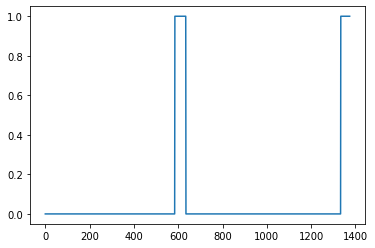

In [ ]:
arr1 = insert_ones(np.zeros((1, Ty)), 9700)
plt.plot(insert_ones(arr1, 4251)[0,:])
print("sanity checks:", arr1[0][1333], arr1[0][634], arr1[0][635])

#### Creating a training example
Finally, we can use `insert_audio_clip` and `insert_ones` to create a new training example.

**Implementing `create_training_example()`**. We will need to carry out the following steps:

1. Initialize the label vector $y$ as a numpy array of zeros and shape $(1, T_y)$.
2. Initialize the set of existing segments to an empty list.
3. Randomly select 0 to 4 "activate" audio clips, and insert them onto the 10 second clip. Also insert labels at the correct position in the label vector $y$.
4. Randomly select 0 to 2 negative audio clips, and insert them into the 10 second clip. 

In [ ]:
def create_training_example(background, activates, negatives):
    """
    Creates a training example with a given background, activates, and negatives.
    
    Arguments:
    background -- a 10 second background audio recording
    activates -- a list of audio segments of the word "activate"
    negatives -- a list of audio segments of random words that are not "activate"
    
    Returns:
    x -- the spectrogram of the training example
    y -- the label at each time step of the spectrogram
    """
    
    np.random.seed(18)
    
    # Make background quieter
    background = background - 20

    # Initialize y (label vector) of zeros
    y = np.zeros((1,Ty))

    # Initialize segment times as an empty list
    previous_segments = []
    
    # Select 0-4 random "activate" audio clips from the entire list of "activates" recordings
    number_of_activates = np.random.randint(0, 5)
    random_indices = np.random.randint(len(activates), size=number_of_activates)
    random_activates = [activates[i] for i in random_indices]
    
    # Loop over randomly selected "activate" clips and insert in background
    for random_activate in random_activates:
        # Insert the audio clip on the background
        background, segment_time = insert_audio_clip(background, random_activate, previous_segments)
        # Retrieve segment_start and segment_end from segment_time
        segment_start, segment_end = segment_time
        # Insert labels in "y"
        y = insert_ones(y, segment_end)

    
    # Select 0-2 random negatives audio recordings from the entire list of "negatives" recordings
    number_of_negatives = np.random.randint(0, 3)
    random_indices = np.random.randint(len(negatives), size=number_of_negatives)
    random_negatives = [negatives[i] for i in random_indices]

    # Loop over randomly selected negative clips and insert in background
    for random_negative in random_negatives:
        # Insert the audio clip on the background 
        background, _ = insert_audio_clip(background, random_negative, previous_segments)
    
    # Standardize the volume of the audio clip 
    background = match_target_amplitude(background, -20.0)

    # Export new training example 
    file_handle = background.export("train" + ".wav", format="wav")
    print("File (train.wav) was saved in your directory.")
    
    # Get and plot spectrogram of the new recording (background with superposition of positive and negatives)
    x = graph_spectrogram("train.wav")
    
    return x, y

File (train.wav) was saved in your directory.


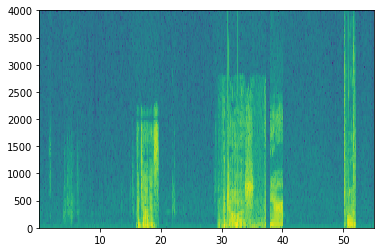

In [ ]:
x, y = create_training_example(backgrounds[0], positives, negatives)

Now we can listen to the training example we just created and compare it to the spectrogram generated above.

In [ ]:
IPython.display.Audio("train.wav")

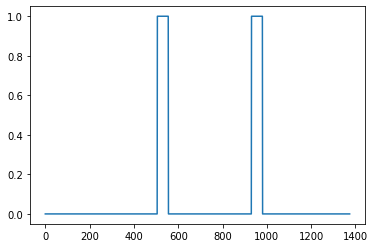

In [ ]:
plt.plot(y[0])

## 1.4 - Full training set

* We've now implemented the code needed to generate a single training example. 
* We used this process to generate a large training set. 

0
File (train.wav) was saved in your directory.
File (train.wav) was saved in your directory.
File (train.wav) was saved in your directory.
File (train.wav) was saved in your directory.
File (train.wav) was saved in your directory.
File (train.wav) was saved in your directory.
File (train.wav) was saved in your directory.
File (train.wav) was saved in your directory.
File (train.wav) was saved in your directory.
File (train.wav) was saved in your directory.
10
File (train.wav) was saved in your directory.
File (train.wav) was saved in your directory.
File (train.wav) was saved in your directory.
File (train.wav) was saved in your directory.
File (train.wav) was saved in your directory.
File (train.wav) was saved in your directory.
File (train.wav) was saved in your directory.
File (train.wav) was saved in your directory.
File (train.wav) was saved in your directory.
File (train.wav) was saved in your directory.
20
File (train.wav) was saved in your directory.
File (train.wav) was saved

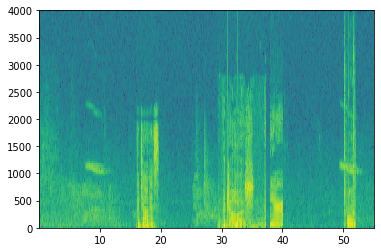

In [ ]:
np.random.seed(4543)

nsamples = 32
X = []
Y = []
for i in range(0, nsamples):
    if i%10 == 0:
        print(i)
    x, y = create_training_example(backgrounds[i % 2], positives, negatives)
    X.append(x.swapaxes(0,1))
    Y.append(y.swapaxes(0,1))
X = np.array(X)
Y = np.array(Y)

In [ ]:
X.shape, Y.shape

((32, 5511, 101), (32, 1375, 1))

In [ ]:
# Save the data for further uses
# np.save(f'./XY_train/X.npy', X)
# np.save(f'./XY_train/Y.npy', Y)

# Load the preprocessed training examples
# X = np.load("./XY_train/X.npy")
# Y = np.load("./XY_train/Y.npy")

##  1.5 - Development Set

* To test our model, we recorded a development set of 25 examples.
* While our training data is synthesized, we want to create a development set using the same distribution as the real inputs.
* Thus, we recorded 25 10-second audio clips of people saying "activate" and other random words, and labeled them by hand.
* This follows the principle that we should create the dev set to be as similar as possible to the test set distribution
* This is why our dev set uses real audio rather than synthesized audio.

In [ ]:
# Load preprocessed dev set examples
X_dev = np.load("./XY_dev/X_dev.npy")
Y_dev = np.load("./XY_dev/Y_dev.npy")

## 2 - The Model

* Now that we've built a dataset, let's write and train a trigger word detection model!
* The model will use 1-D convolutional layers, GRU layers, and dense layers.
* Let's load the packages that will allow you to use these layers in Tensorflow Keras.

In [5]:
from tensorflow.keras.callbacks import ModelCheckpoint
from tensorflow.keras.models import Model, load_model, Sequential
from tensorflow.keras.layers import Dense, Activation, Dropout, Input, Masking, TimeDistributed, LSTM, Conv1D
from tensorflow.keras.layers import GRU, Bidirectional, BatchNormalization, Reshape
from tensorflow.keras.optimizers import Adam

## 2.1 - Build the model

Our goal is to build a network that will ingest a spectrogram and output a signal when it detects the trigger word. This network will use 4 layers:
    * A convolutional layer
    * Two GRU layers
    * A dense layer. 

Here is the architecture we will use.

<img src="images/model.png" style="width:600px;height:600px;">
<center> **Figure 3** </center>

##### 1D convolutional layer
One key layer of this model is the 1D convolutional step (near the bottom of Figure 3). 
* It inputs the 5511 step spectrogram.  Each step is a vector of 101 units.
* It outputs a 1375 step output
* This output is further processed by multiple layers to get the final $T_y = 1375$ step output. 
* This 1D convolutional layer plays a role similar to the 2D convolutions, of extracting low-level features and then possibly generating an output of a smaller dimension. 
* Computationally, the 1-D conv layer also helps speed up the model because now the GRU  can process only 1375 timesteps rather than 5511 timesteps. 

##### GRU, dense and sigmoid
* The two GRU layers read the sequence of inputs from left to right.
* A dense plus sigmoid layer makes a prediction for $y^{\langle t \rangle}$. 
* Because $y$ is a binary value (0 or 1), we use a sigmoid output at the last layer to estimate the chance of the output being 1, corresponding to the user having just said "activate."

#### Unidirectional RNN
* Note that we use a **unidirectional RNN** rather than a bidirectional RNN. 
* This is really important for trigger word detection, since we want to be able to detect the trigger word almost immediately after it is said. 
* If we used a bidirectional RNN, we would have to wait for the whole 10sec of audio to be recorded before we could tell if "activate" was said in the first second of the audio clip.  

In [6]:
# GRADED FUNCTION: model

def model(input_shape):
    """
    Function creating the model's graph in Keras.
    
    Argument:
    input_shape -- shape of the model's input data (using Keras conventions)

    Returns:
    model -- Keras model instance
    """
    
    X_input = Input(shape = input_shape)
    

    # CONV layer
    X = Conv1D(filters=196,kernel_size=15,strides=4)(X_input)            # CONV1D
    X = BatchNormalization()(X)                              # Batch normalization
    X = Activation("relu")(X)                          # ReLu activation
    X = Dropout(rate=0.8)(X)                               # dropout (use 0.8)

    # First GRU Layer
    X = GRU(units=128, return_sequences = True)(X)     # GRU (use 128 units and return the sequences) , reset_after=True
    X = Dropout(rate=0.8)(X)                                 # dropout (use 0.8)
    X = BatchNormalization()(X)                # Batch normalization
    
    # Second GRU Layer
    X = GRU(units=128, return_sequences = True)(X)    # GRU (use 128 units and return the sequences) , reset_after=True
    X = Dropout(rate=0.8)(X)                                 # dropout (use 0.8)
    X = BatchNormalization()(X)                     # Batch normalization
    X = Dropout(rate=0.8)(X)                                 # dropout (use 0.8)
    
    # Time-distributed dense layer
    X = TimeDistributed(Dense(1, activation = "sigmoid"))(X) # time distributed  (sigmoid)


    model = Model(inputs = X_input, outputs = X)
    
    return model  

In [7]:
model = model(input_shape = (Tx, n_freq))

In [8]:
model.summary()

Model: "functional_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 5511, 101)]       0         
_________________________________________________________________
conv1d (Conv1D)              (None, 1375, 196)         297136    
_________________________________________________________________
batch_normalization (BatchNo (None, 1375, 196)         784       
_________________________________________________________________
activation (Activation)      (None, 1375, 196)         0         
_________________________________________________________________
dropout (Dropout)            (None, 1375, 196)         0         
_________________________________________________________________
gru (GRU)                    (None, 1375, 128)         125184    
_________________________________________________________________
dropout_1 (Dropout)          (None, 1375, 128)        

The output of the network is of shape (None, 1375, 1) while the input is (None, 5511, 101). The Conv1D has reduced the number of steps from 5511 to 1375. 

## 2.2 - Fit the model

In [ ]:
opt = Adam(lr=0.0001, beta_1=0.9, beta_2=0.999, decay=0.01)
model.compile(loss='binary_crossentropy', optimizer=opt, metrics=["accuracy"])

In [ ]:
model.fit(X, Y, batch_size = 5, epochs=100)

Epoch 1/100
7/7 [==============================] - 9s 1s/step - loss: 1.2902 - accuracy: 0.5042
Epoch 2/100
7/7 [==============================] - 11s 2s/step - loss: 1.2533 - accuracy: 0.5115
Epoch 3/100
7/7 [==============================] - 11s 2s/step - loss: 1.2498 - accuracy: 0.5118
Epoch 4/100
7/7 [==============================] - 10s 1s/step - loss: 1.2268 - accuracy: 0.5135
Epoch 5/100
7/7 [==============================] - 9s 1s/step - loss: 1.1951 - accuracy: 0.5249
Epoch 6/100
7/7 [==============================] - 9s 1s/step - loss: 1.1708 - accuracy: 0.5275
Epoch 7/100
7/7 [==============================] - 9s 1s/step - loss: 1.1303 - accuracy: 0.5394
Epoch 8/100
7/7 [==============================] - 10s 1s/step - loss: 1.1220 - accuracy: 0.5470
Epoch 9/100
7/7 [==============================] - 10s 1s/step - loss: 1.0917 - accuracy: 0.5623
Epoch 10/100
7/7 [==============================] - 9s 1s/step - loss: 1.0585 - accuracy: 0.5810
Epoch 11/100
7/7 [================

* Trigger word detection takes a long time to train. 
* To save time, we'll use an already trained model that was trained for about 3 hours on a GPU using the architecture we built above, and a large training set of about 4000 examples. 
* Let's load the model. 

In [9]:
import tensorflow as tf

In [10]:
tf.compat.v1.disable_v2_behavior()
model = tf.compat.v1.keras.models.load_model('./models/tr_model.h5')

# model = load_model('./models/tr_model.h5')

Instructions for updating:
non-resource variables are not supported in the long term


## 2.3 - Test the model

Finally, let's see how your model performs on the dev set.

In [ ]:
loss, acc = model.evaluate(X_dev, Y_dev)
print("Dev set accuracy = ", acc)

This looks pretty good! 
* However, accuracy isn't a great metric for this task
    * Since the labels are heavily skewed to 0's, a neural network that just outputs 0's would get slightly over 90% accuracy. 
* We could define more useful metrics such as F1 score or Precision/Recall. 
    * We will not bother with that here, and instead just empirically see how the model does with some predictions.

# 3 - Making Predictions

Now that you have built a working model for trigger word detection, let's use it to make predictions. This code snippet runs audio (saved in a wav file) through the network. 

<!--
can use your model to make predictions on new audio clips.

You will first need to compute the predictions for an input audio clip.

**Exercise**: Implement predict_activates(). You will need to do the following:

1. Compute the spectrogram for the audio file
2. Use `np.swap` and `np.expand_dims` to reshape your input to size (1, Tx, n_freqs)
5. Use forward propagation on your model to compute the prediction at each output step
!-->


In [11]:
def detect_triggerword(filename):
    plt.subplot(2, 1, 1)

    x = graph_spectrogram(filename)
    # the spectrogram outputs (freqs, Tx) and we want (Tx, freqs) to input into the model
    x  = x.swapaxes(0,1)
    x = np.expand_dims(x, axis=0)
    predictions = model.predict(x)
    
    plt.subplot(2, 1, 2)
    plt.plot(predictions[0,:,0])
    plt.ylabel('probability')
    plt.show()
    return predictions

#### Insert a chime to acknowledge the "activate" trigger
* Once we've estimated the probability of having detected the word "activate" at each output step, you can trigger a "chiming" sound to play when the probability is above a certain threshold. 
* $y^{\langle t \rangle}$ might be near 1 for many values in a row after "activate" is said, yet we want to chime only once. 
    * So we will insert a chime sound at most once every 75 output steps. 
    * This will help prevent us from inserting two chimes for a single instance of "activate". 
    * This plays a role similar to non-max suppression from computer vision.


**Implementing chime_on_activate()**

1. We loop over the predicted probabilities at each output step
2. When the prediction is larger than the threshold and more than 75 consecutive time steps have passed, we insert a "chime" sound onto the original audio clip

We use this code to convert from the 1,375 step discretization to the 10,000 step discretization and insert a "chime" using pydub:

` audio_clip = audio_clip.overlay(chime, position = ((i / Ty) * audio.duration_seconds)*1000)
`

In [12]:
chime_file = "audio_examples/chime.wav"
def chime_on_activate(filename, predictions, threshold):
    audio_clip = AudioSegment.from_wav(filename)
    chime = AudioSegment.from_wav(chime_file)
    Ty = predictions.shape[1]
    # Initialize the number of consecutive output steps to 0
    consecutive_timesteps = 0
    # Loop over the output steps in the y
    for i in range(Ty):
        # Increment consecutive output steps
        consecutive_timesteps += 1
        # If prediction is higher than the threshold and more than 75 consecutive output steps have passed
        if predictions[0,i,0] > threshold and consecutive_timesteps > 75:
            # Superpose audio and background using pydub
            audio_clip = audio_clip.overlay(chime, position = ((i / Ty) * audio_clip.duration_seconds)*1000)
            # Reset consecutive output steps to 0
            consecutive_timesteps = 0
        
    audio_clip.export("chime_output.wav", format='wav')

## 3.3 - Test on dev examples

Let's explore how our model performs on two unseen audio clips from the development set. Lets first listen to the two dev set clips. 

In [ ]:
IPython.display.Audio("./raw_data/dev/Recording.wav")

Now lets run the model on these audio clips and see if it adds a chime after "activate"!

Instructions for updating:
This property should not be used in TensorFlow 2.0, as updates are applied automatically.


C:\ProgramData\Anaconda3\lib\site-packages\matplotlib\axes\_axes.py:7747: RuntimeWarning: divide by zero encountered in log10
  Z = 10. * np.log10(spec)


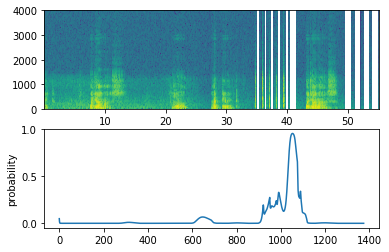

In [13]:
filename = "./raw_data/dev/Recording.wav"
prediction = detect_triggerword(filename)
chime_on_activate(filename, prediction, 0.5)
IPython.display.Audio("./chime_output.wav")

# 4 - Trying other examples!

Here we can try your model on our own audio clips outisde of dev set! 

* We record a 10 second audio clip (as a wav file) of you saying the word "activate" and other random words, and upload it in the directory.
* If the audio recording is not 10 seconds, the code below will either trim or pad it as needed to make it 10 seconds. 

In [35]:
# Preprocess the audio to the correct format
def preprocess_audio(filename):
    # Trim or pad audio segment to 10000ms
    padding = AudioSegment.silent(duration=10000)
    segment = AudioSegment.from_wav(filename)[:10000]
    segment = padding.overlay(segment)
    # Set frame rate to 44100
    segment = segment.set_frame_rate(44100)
    # Export as wav
    segment.export(filename, format='wav')

In [36]:
your_filename = "raw_data/dev/Recording.wav"

In [37]:
preprocess_audio(your_filename)
IPython.display.Audio(your_filename) # listen to the audio we uploaded 

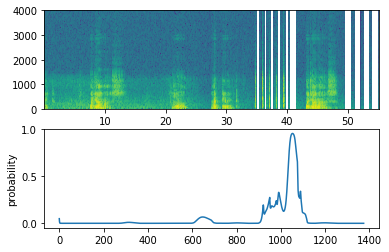

In [ ]:
chime_threshold = 0.5
prediction = detect_triggerword(your_filename)
chime_on_activate(your_filename, prediction, chime_threshold)
IPython.display.Audio("./chime_output.wav")

https://github.com/Tony607/Keras-Trigger-Word/blob/master/trigger_word_real_time_demo.ipynb

# 5 - Real-time Demo

So far our model can only take a static 10 seconds audio clip and make the prediction of the trigger word location.

Here is the fun part, let's replace with the live audio stream instead!

The model we have build expect 10 seconds audio clips as input. While training another model that takes shorter audio clips is possible but needs us retraining the model on a GPU for several hours.

We also don't want to wait for 10-second for the model tells us the trigger word is detected. So one solution is to have a moving 10 seconds audio stream window with a step size of 0.5 second. Which means we ask the model to predict every 0.5 seconds, that reduce the delay and make it responsive.

We also add the silence detection mechanism to skip prediction if the loudness is below a threshold, this can save some computing power.

### Let's see how to build it, 

The input 10 seconds audio is updated every 0.5 second. Meaning for every 0.5 second, the oldest 0.5 second chunk of audio will be discarded and the fresh 0.5 second audio will be shifted in. The job of the model is to tell if there is a new trigger word detected in the fresh 0.5 second audio chunk.

And here is the code to make it happen.

In [14]:
def has_new_triggerword(predictions, chunk_duration, feed_duration, threshold=0.5):
    """
    Function to detect new trigger word in the latest chunk of input audio.
    It is looking for the rising edge of the predictions data belongs to the
    last/latest chunk.
    
    Argument:
    predictions -- predicted labels from model
    chunk_duration -- time in second of a chunk
    feed_duration -- time in second of the input to model
    threshold -- threshold for probability above a certain to be considered positive

    Returns:
    True if new trigger word detected in the latest chunk
    """
    predictions = predictions > threshold
    chunk_predictions_samples = int(len(predictions) * chunk_duration / feed_duration)
    chunk_predictions = predictions[-chunk_predictions_samples:]
    level = chunk_predictions[0]
    for pred in chunk_predictions:
        if pred > level:
            return True
        else:
            level = pred
    return False

To get the audio stream, we use the pyaudio library. Which has an option to read the audio stream asynchronously. That means the audio stream recording happens in another thread and when a new fixed length of audio data is available, it notifies our model to process it in the main thread.

You may ask why not just read a fixed length of audio and just process it in one function? 

Since for the model to generate the prediction, it takes quite some time, sometimes measured in tens of milliseconds. By doing so, we are risking creating gaps in the audio stream while we are doing the computation.

Here is the code for the pyaudio library's callback, in the callback function we send a queue to notify the model to process the data in the main thread.

In [15]:
def detect_triggerword_spectrum(x):
    """
    Function to predict the location of the trigger word.
    
    Argument:
    x -- spectrum of shape (freqs, Tx)
    i.e. (Number of frequencies, The number time steps)

    Returns:
    predictions -- flattened numpy array to shape (number of output time steps)
    """
    # the spectogram outputs  and we want (Tx, freqs) to input into the model
    x  = x.swapaxes(0,1)
    x = np.expand_dims(x, axis=0)
    predictions = model.predict(x)
    return predictions.reshape(-1)

def has_new_triggerword(predictions, chunk_duration, feed_duration, threshold=0.5):
    """
    Function to detect new trigger word in the latest chunk of input audio.
    It is looking for the rising edge of the predictions data belongs to the
    last/latest chunk.
    
    Argument:
    predictions -- predicted labels from model
    chunk_duration -- time in second of a chunk
    feed_duration -- time in second of the input to model
    threshold -- threshold for probability above a certain to be considered positive

    Returns:
    True if new trigger word detected in the latest chunk
    """
    predictions = predictions > threshold
    chunk_predictions_samples = int(len(predictions) * chunk_duration / feed_duration)
    chunk_predictions = predictions[-chunk_predictions_samples:]
    level = chunk_predictions[0]
    for pred in chunk_predictions:
        if pred > level:
            return True
        else:
            level = pred
    return False

### Record audio stream from mic

In [20]:
chunk_duration = 0.5 # Each read length in seconds from mic.
fs = 44100 # sampling rate for mic
chunk_samples = int(fs * chunk_duration) # Each read length in number of samples.

# Each model input data duration in seconds, need to be an integer numbers of chunk_duration
feed_duration = 10
feed_samples = int(fs * feed_duration)

assert feed_duration/chunk_duration == int(feed_duration/chunk_duration)

In [16]:
def get_spectrogram(data):
    """
    Function to compute a spectrogram.
    
    Argument:
    predictions -- one channel / dual channel audio data as numpy array

    Returns:
    pxx -- spectrogram, 2-D array, columns are the periodograms of successive segments.
    """
    nfft = 200 # Length of each window segment
    fs = 8000 # Sampling frequencies
    noverlap = 120 # Overlap between windows
    nchannels = data.ndim
    if nchannels == 1:
        pxx, _, _ = mlab.specgram(data, nfft, fs, noverlap = noverlap)
    elif nchannels == 2:
        pxx, _, _ = mlab.specgram(data[:,0], nfft, fs, noverlap = noverlap)
    return pxx

In [17]:
def plt_spectrogram(data):
    """
    Function to compute and plot a spectrogram.
    
    Argument:
    predictions -- one channel / dual channel audio data as numpy array

    Returns:
    pxx -- spectrogram, 2-D array, columns are the periodograms of successive segments.
    """
    nfft = 200 # Length of each window segment
    fs = 8000 # Sampling frequencies
    noverlap = 120 # Overlap between windows
    nchannels = data.ndim
    if nchannels == 1:
        pxx, _, _, _ = plt.specgram(data, nfft, fs, noverlap = noverlap)
    elif nchannels == 2:
        pxx, _, _, _ = plt.specgram(data[:,0], nfft, fs, noverlap = noverlap)
    return pxx

### Audio Stream

In [18]:
def get_audio_input_stream(callback):
    stream = pyaudio.PyAudio().open(
        format=pyaudio.paInt16,
        channels=1,
        rate=fs,
        input=True,
        frames_per_buffer=chunk_samples,
        input_device_index=0,
        stream_callback=callback)
    return stream

In [23]:
import pyaudio
from queue import Queue
from threading import Thread
import sys
import time


# Queue to communiate between the audio callback and main thread
q = Queue()

run = True

silence_threshold = 100

# Run the demo for a timeout seconds
timeout = time.time() + 0.5*60  # 0.5 minutes from now

# Data buffer for the input wavform
data = np.zeros(feed_samples, dtype='int16')

def callback(in_data, frame_count, time_info, status):
    global run, timeout, data, silence_threshold    
    if time.time() > timeout:
        run = False        
    data0 = np.frombuffer(in_data, dtype='int16')
    if np.abs(data0).mean() < silence_threshold:
        sys.stdout.write('-')
        return (in_data, pyaudio.paContinue)
    else:
        sys.stdout.write('.')
    data = np.append(data,data0)    
    if len(data) > feed_samples:
        data = data[-feed_samples:]
        # Process data async by sending a queue.
        q.put(data)
    return (in_data, pyaudio.paContinue)

stream = get_audio_input_stream(callback)
stream.start_stream()


try:
    while run:
        data = q.get()
        spectrum = get_spectrogram(data)
        preds = detect_triggerword_spectrum(spectrum)
        new_trigger = has_new_triggerword(preds, chunk_duration, feed_duration)
        if new_trigger:
            sys.stdout.write('1')
except (KeyboardInterrupt, SystemExit):
    stream.stop_stream()
    stream.close()
    timeout = time.time()
    run = False
        
stream.stop_stream()
stream.close()

-.-..-..-.....1..1.1...-......1..1--....1..1.1.............1.-...1.-.

When we run it, it outputs one of the 3 characters every 0.5 second.

"-" means silence,

"." means not silence and no trigger word,

"1" means a new trigger word is detected.

In [24]:
stream.stop_stream()
stream.close()